In [1]:
#Import necessary packages igraph, scvelo, scanpy, anndata, pandas, os, numpy
!pip install -U scvelo
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import scvelo as scv
scv.logging.print_version()

#test whether igraph is imported
import igraph as ig

import loompy
import numpy as np
import scanpy as sc
import anndata
import pandas as pd
import os
import louvain
cwd = os.getcwd()
cwd

Requirement already up-to-date: scvelo in /usr/local/lib/python3.7/site-packages (0.2.1)


/usr/local/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


Running scvelo 0.2.1 (python 3.7.7) on 2020-06-02 14:23.


'/Users/whippoorwill/Desktop/Jupyter'

Import the data file from inside the Jupyter folder as "adata"

In [2]:
adata = scv.read("mgAVM02/adata_mgAVM02.h5ad",cache = True)

If you get a message that "variable names are not unique", run the first line (make_unique). Also set verbosity and figure params for good visualization. 

In [3]:
#adata.var_names_make_unique()
scv.settings.verbosity = 4  # show errors(0), warnings(1), info(2) and hints(3)
scv.settings.set_figure_params('scvelo')  # for beautified visualization

In [4]:
# show proportions of spliced/unspliced abundances
scv.utils.show_proportions(adata)
adata

Abundance of ['spliced', 'unspliced']: [0.6 0.4]


AnnData object with n_obs × n_vars = 12330 × 6000 
    obs: 'nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm', 'velocity_offset', 'velocity_offset2', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'velocity_score', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_alignment_scaling'
    uns: 'age_colors', 'condition_colors', 'finalclusters_colors', 'neighbors', 'rank_velocity_genes', 'recover_dynamics', 'velocity_graph', 'velocity_graph_neg', 'velocity_settings'
    obsm: 'X_umap', 'X_pca', 'velocity_umap'
    varm: 'loss'
    layers: 'Ms', 'Mu', 'ambiguous', 'fit_t', 'fit

Open a file containing the names of the subset of cells that you want to use, if you need the cells subsetted. I will only use the mg subset (from R). 

Split the object in 4 parts (by sample_description)

In [9]:
adata_C = adata.copy()
adata_C = adata_C[adata_C.obs['condition'] == "Control",:]
adata_C = adata_C.copy()
adata_D = adata.copy()
adata_D = adata_D[adata_D.obs['condition'] == "Deprived",:]
adata_D = adata_D.copy()

In [3]:
adata_5 = adata.copy()
adata_5 = adata_5[adata_5.obs['age'] == "P5",:]
adata_5 = adata_5.copy()
adata_7 = adata.copy()
adata_7 = adata_7[adata_7.obs['age'] == "P7",:]
adata_7 = adata_7.copy()

In [6]:
print(adata_C,adata_D)

AnnData object with n_obs × n_vars = 5510 × 6000 
    obs: 'nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm', 'velocity_offset', 'velocity_offset2', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'velocity_score', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_alignment_scaling'
    uns: 'age_colors', 'condition_colors', 'finalclusters_colors', 'neighbors', 'rank_velocity_genes', 'recover_dynamics', 'velocity_graph', 'velocity_graph_neg', 'velocity_settings'
    obsm: 'X_umap', 'X_pca', 'velocity_umap'
    varm: 'loss'
    layers: 'Ms', 'Mu', 'ambiguous', 'fit_t', 'fit_

In [10]:
l = [adata_C,adata_D]

In [11]:
for item in l:
    scv.pp.filter_genes(item,min_counts = 10)   
    scv.pp.normalize_per_cell(item,enforce = True,use_initial_size=True) #enforce means recalculate 
    scv.pp.log1p(item)
    scv.pp.neighbors(item,n_neighbors = 80, n_pcs = 10, method = 'sklearn',use_rep = "X_pca",random_state = 1)
    scv.pp.moments(item, n_neighbors=80, n_pcs=10,method='sklearn',mode = 'connectivities',use_rep = "X_pca")
    scv.tl.velocity(item,mode = 'stochastic',filter_genes = False,use_raw=False,fit_offset = True, fit_offset2 = True)

Filtered out 339 genes that are detected 10 counts (spliced).
Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:08) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished (0:00:09) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
Filtered out 458 genes that are detected 10 counts (spliced).
Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:06) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished (0:00:07) --> added 
    'velocity', velocity vectors fo

If you want to look at the velocity of a single gene, put it in the code below.

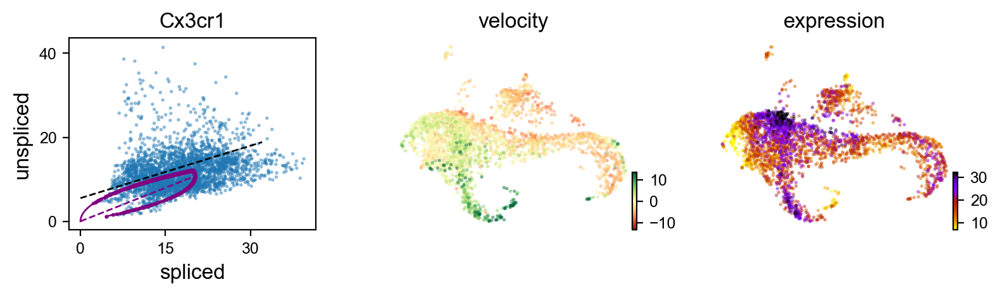

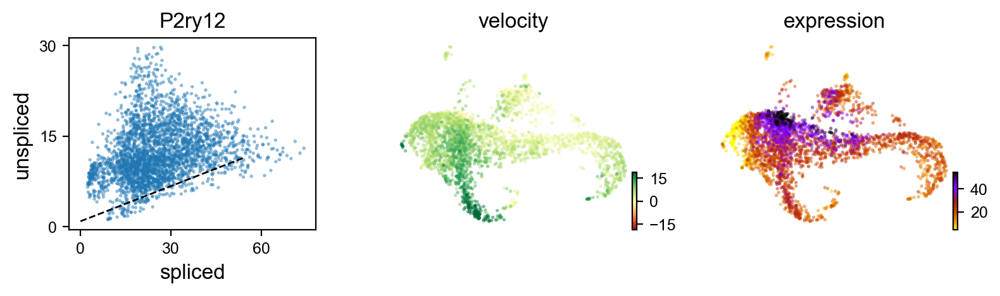

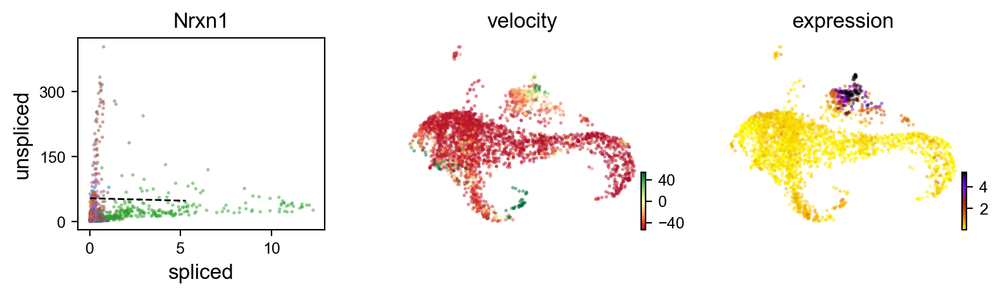

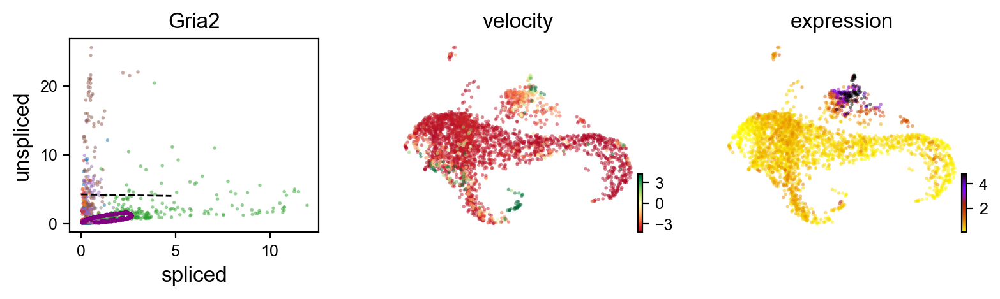

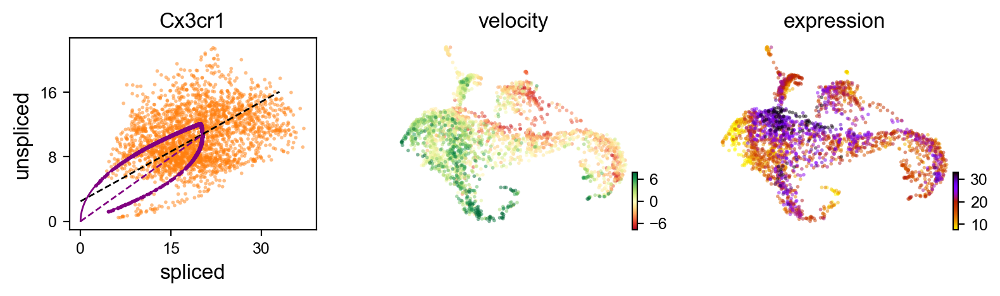

...

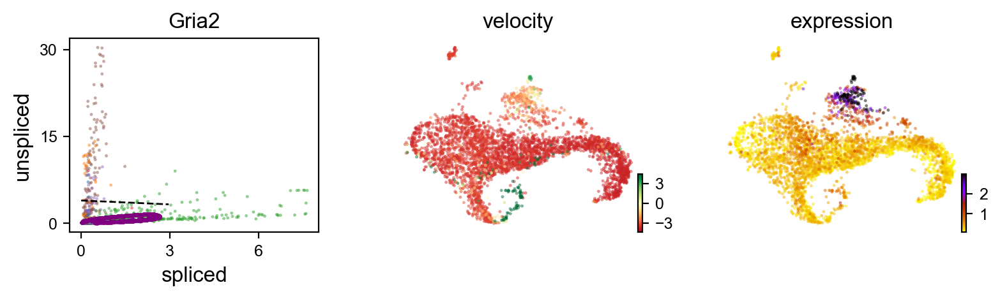

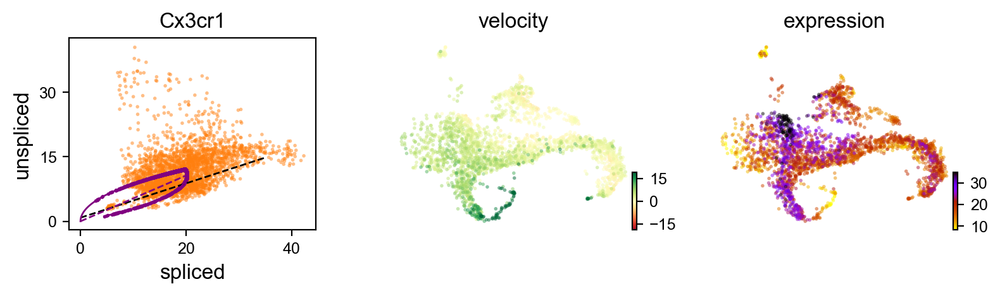

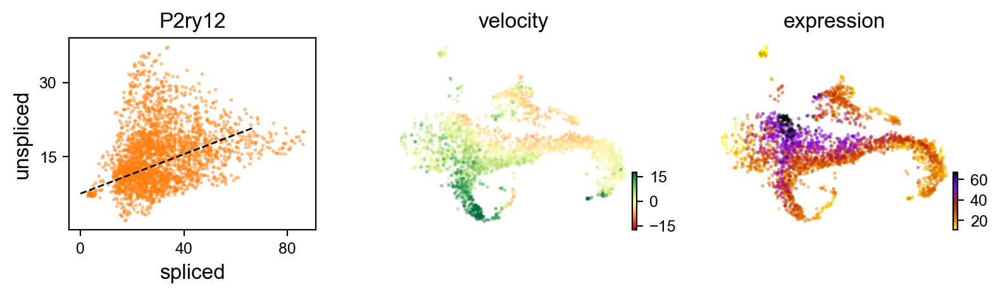

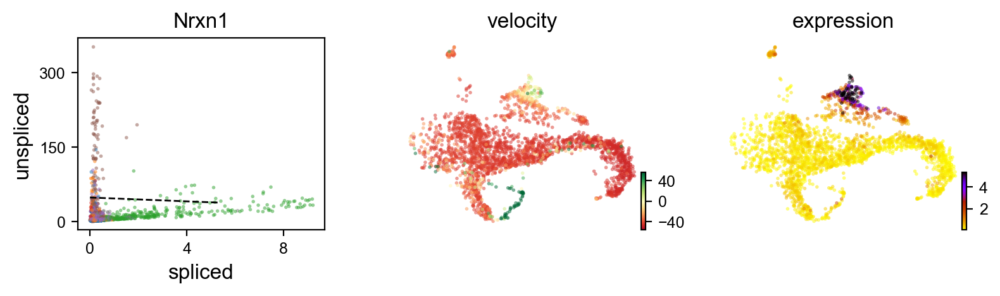

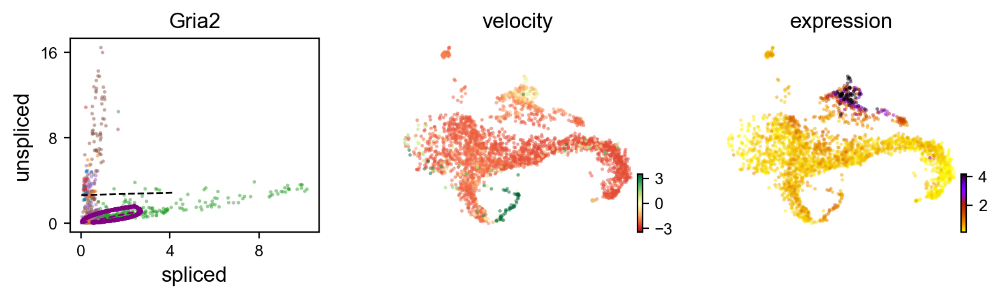

In [30]:
for item in l:
    scv.pl.velocity(item,var_names = "Cx3cr1",show=True,color='condition')
    scv.pl.velocity(item,var_names = "P2ry12",show=True,color = 'age')
    scv.pl.velocity(item,var_names = "Nrxn1",show=True,color = 'finalclusters')
    scv.pl.velocity(item,var_names = "Gria2",show=True,color = 'finalclusters')

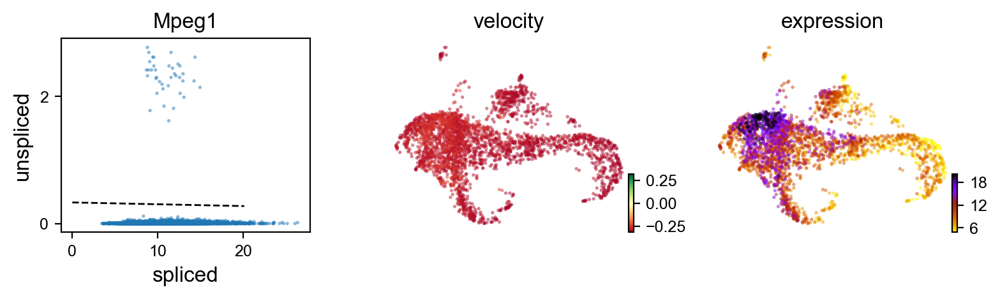

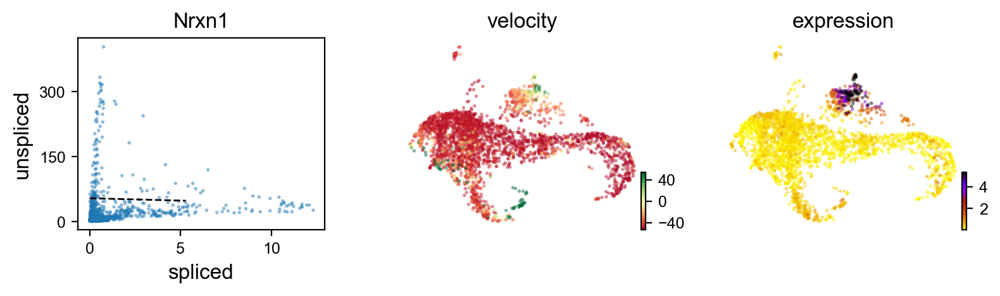

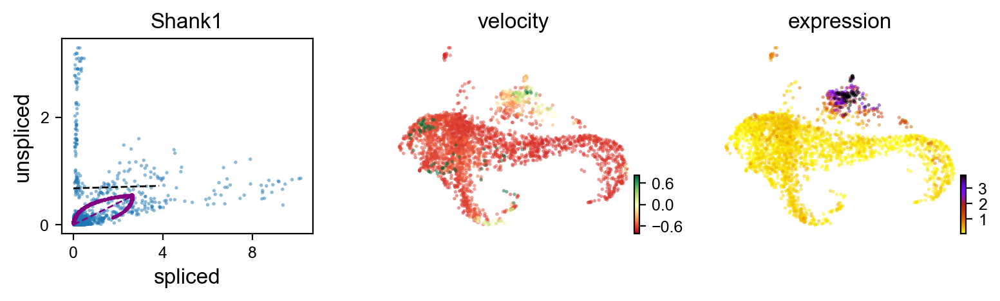

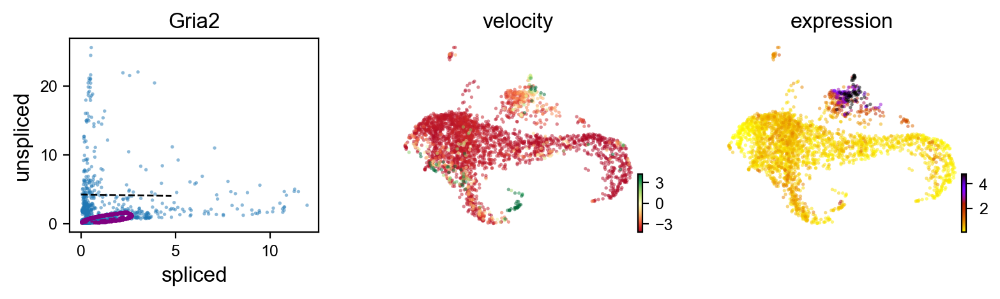

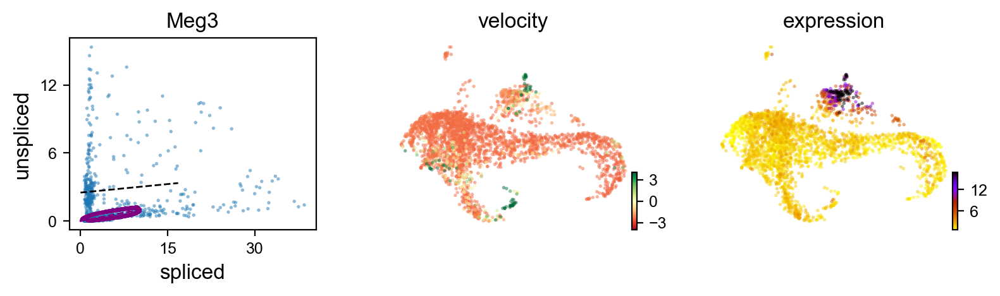

...

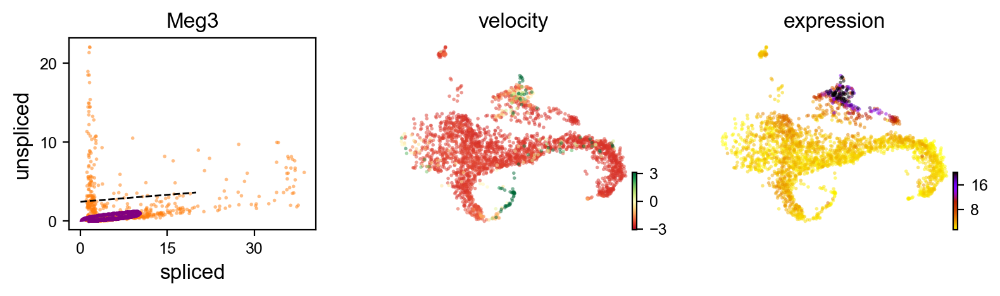

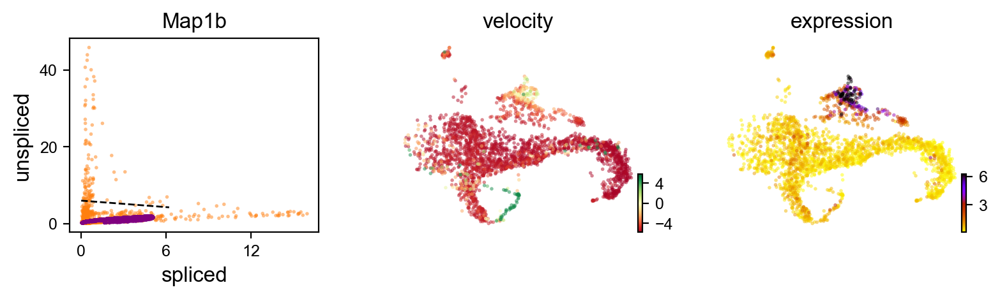

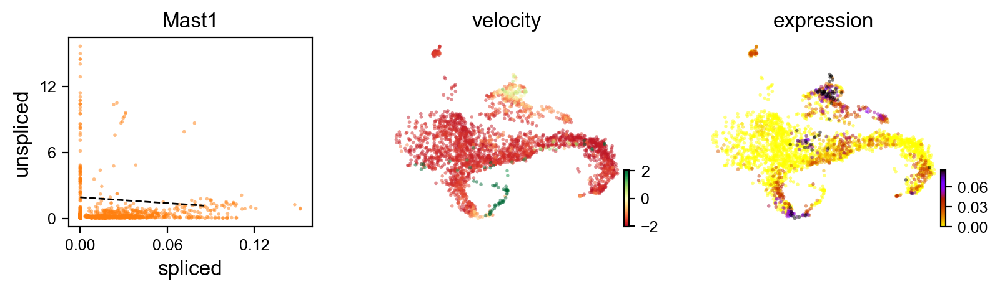

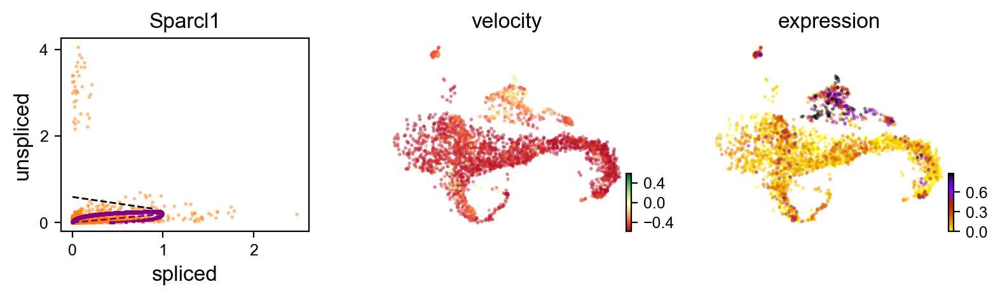

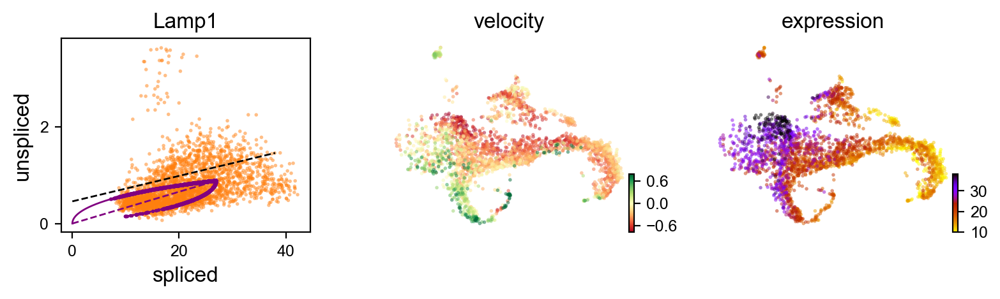

In [31]:
for bdata in l:
    scv.pl.velocity(bdata,var_names = "Mpeg1",show = True, color = 'condition')
    scv.pl.velocity(bdata,var_names = "Nrxn1",show = True, color = 'condition')
    scv.pl.velocity(bdata,var_names = "Shank1",show = True, color = 'condition')
    scv.pl.velocity(bdata,var_names = "Gria2",show = True, color = 'condition')
    scv.pl.velocity(bdata,var_names = "Meg3",show = True, color = 'condition')
    scv.pl.velocity(bdata,var_names = "Map1b",show = True, color = 'condition')
    scv.pl.velocity(bdata,var_names = "Mast1",show = True, color = 'condition')
    scv.pl.velocity(bdata,var_names = "Sparcl1",show = True, color = 'condition')
    scv.pl.velocity(bdata,var_names = "Lamp1",show = True, color = 'condition')

In [12]:
for bdata in l:
    scv.tl.velocity_graph(bdata)
    scv.tl.velocity_embedding(bdata, basis='umap')#compute velocity graph

computing velocity graph
    finished (0:01:50) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
computing velocity graph
    finished (0:01:15) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


saving figure to file ./figures/scvelo_Controlscvelo_sep.png


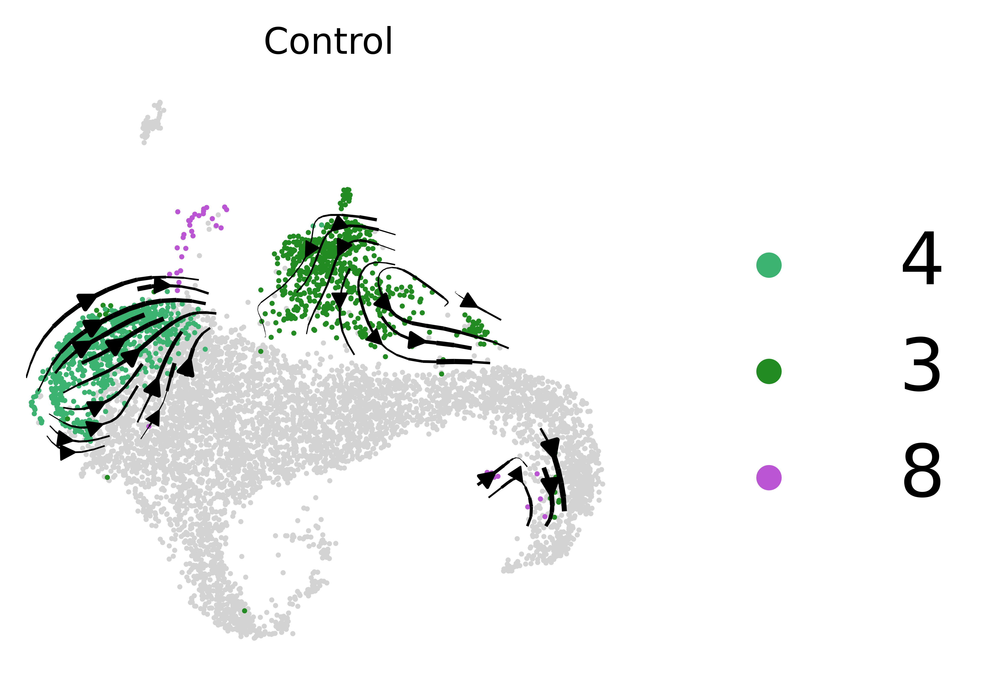

saving figure to file ./figures/scvelo_Deprivedscvelo_sep.png


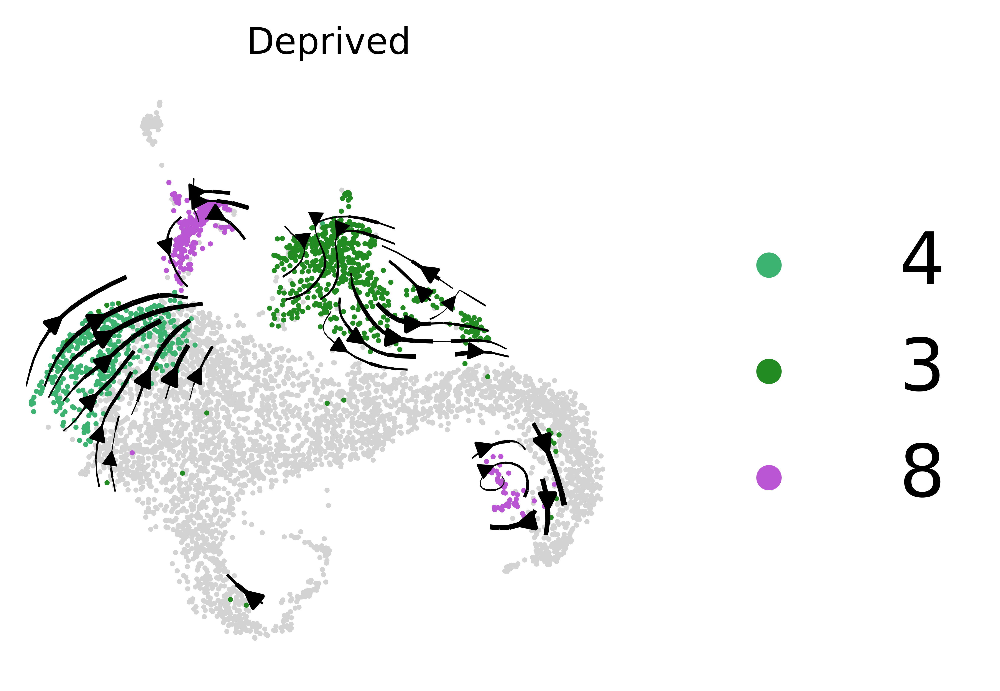

In [14]:
for bdata in l:
    scv.pl.velocity_embedding_stream(bdata,
                                 linewidth = 0.8,
                                 size = 8,
                                 min_mass = 3,
                                 density = 0.5,
                                 basis = "umap",
                                 color = ['finalclusters'],
                                 palette = ['darkgoldenrod','y','forestgreen','mediumseagreen','lightcoral','lightskyblue','mediumorchid','hotpink'],
                                 groups = ['4','3','8'],
                                 alpha=1,
                                 legend_loc = 'right margin',
                                 legend_fontsize = 20,
                                 title = bdata.obs['condition'][1],
                                 arrow_color = 'black',
                                 fontsize = 10,
                                 figsize = (3,3),
                                 smooth = True,
                                 dpi = 1200,
                                 save = bdata.obs['condition'][1] + "scvelo_sep.png"
                                )

In [31]:
# for bdata in l:
#     scv.pl.velocity_embedding(bdata, basis='umap', legend_loc = 'right margin',
#                               color = ['age'],size = 1, arrow_length=8, arrow_size=2, dpi=300)


In [42]:
?scv.pl.velocity_embedding_stream

saving figure to file ./figures/scvelo_Control_P5arrowheads_sep.pdf


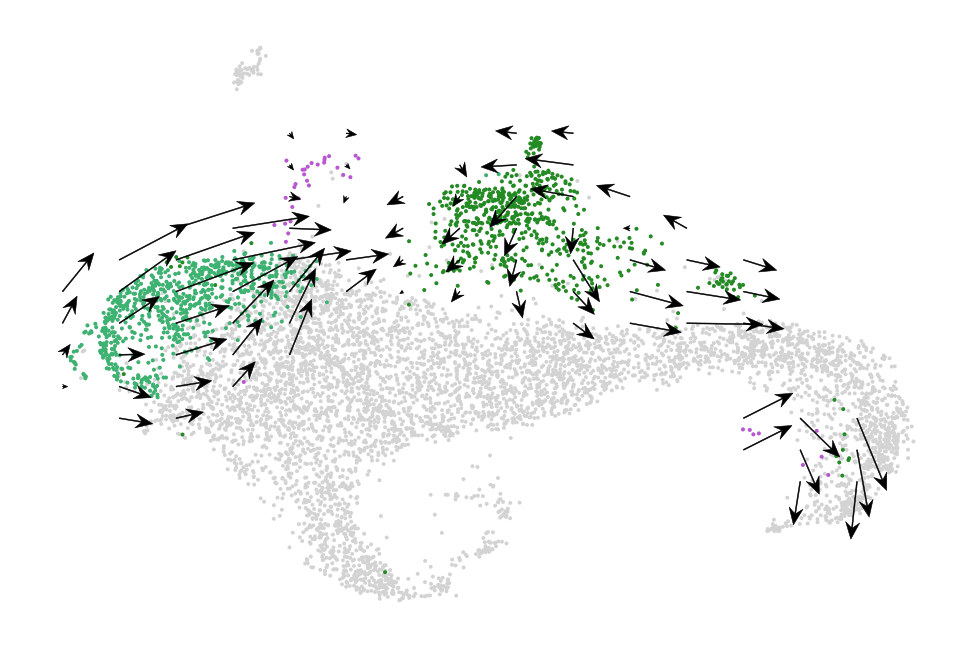

saving figure to file ./figures/scvelo_Deprived_P5arrowheads_sep.pdf


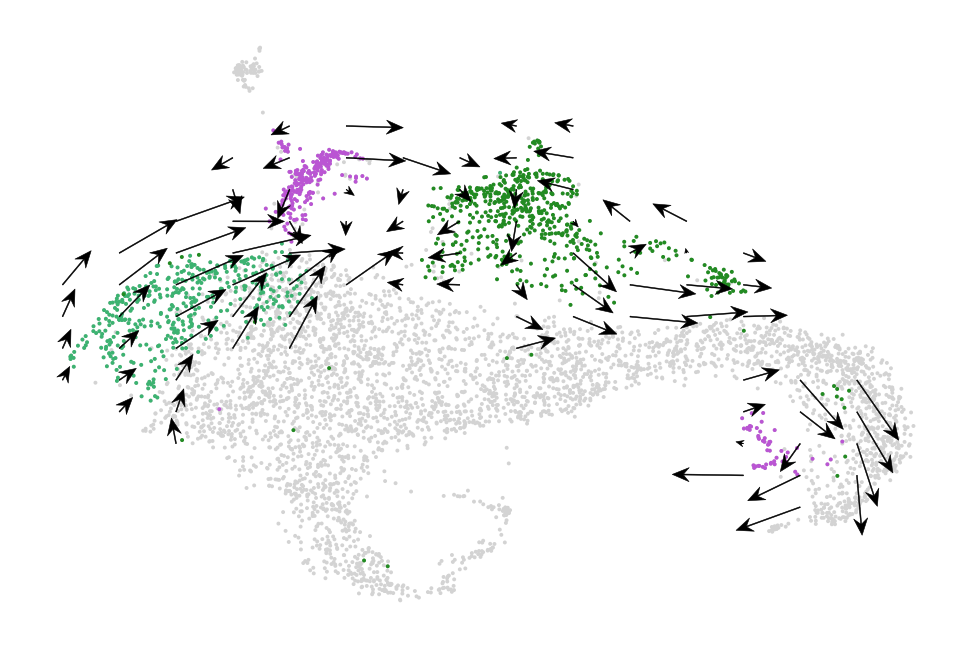

In [17]:
for bdata in l:
    scv.pl.velocity_embedding_grid(bdata,
                               color=['finalclusters'], 
                               layer=['velocity'], 
                               arrow_size=3,
                               arrow_length = 5,
                               arrow_color = 'black',
                               groups = ['3','4','8'],
                               density = 0.3,
                               min_mass = 5,
                               title = "",
                               save = bdata.obs['sample_description'][1] + "arrowheads_sep.pdf",
                               alpha = 1,
                               size = 8,
                               perc=95,
                               colorbar=True)

In [39]:
for bdata in l:
    scv.tl.rank_velocity_genes(bdata, groupby = 'finalclusters')
    print(bdata.uns['rank_velocity_genes']['names'])

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns)
[('Bora', 'Tk1', 'Jag2', 'Plekhg5', 'Mcm6', 'Cyp27a1', 'Slfn8', 'Ifi207')
 ('Ect2', 'Zwilch', 'Tub', 'Mylip', 'Inpp4b', 'Siglech', 'Oas2', 'Fcgr2b')
 ('Kifc1', 'Cenpn', 'Lrp8', 'Neurl3', 'Bank1', 'Mgat4a', 'Ifi207', 'Slc14a1')
 ('Dlgap5', 'Wdhd1', 'Rap1gap', 'Abca1', 'Numb', 'Cd300c2', 'Hpse', 'Oas2')
 ('Kif18b', 'Brca1', 'Kif1a', 'Ypel2', 'Mcm3', 'Arsb', 'Slfn5', 'Bend4')
 ('Ska3', 'Cenpu', 'Iglon5', 'Abcg1', 'Phactr2', 'Snx2', 'Jag2', 'Slfn5')
 ('Cenpa', 'Exo1', 'Adam11', 'Prune2', 'Tmem63a', 'Limd1', 'Slfn9', 'Dse')
 ('Cdca8', 'Ndc1', 'Lrrc45', 'Klhl24', 'Fchsd2', 'Tgfbr1', 'Sun2', 'Mrc1')
 ('Eme1', 'Brip1', 'Dab2ip', 'Pnpla7', 'Lpcat2', 'I830077J02Rik', 'Oasl2', 'Plekhg5')
 ('Racgap1', 'Cenph', 'Ccne2', 'Ms4a6b', 'Itpr2', 'Lst1', 'Nes', 'Tub')]
ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.

computing terminal states
    identified 1 region of root cells and 1 region of end points 
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_Control_P5end_sep.pdf


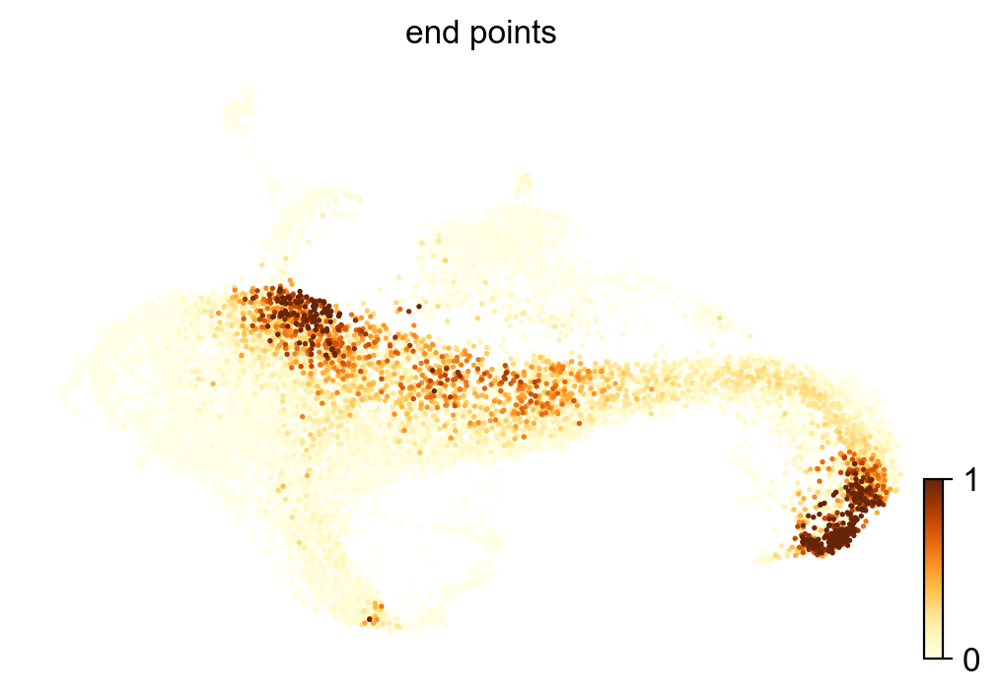

saving figure to file ./figures/scvelo_Control_P5root_sep.pdf


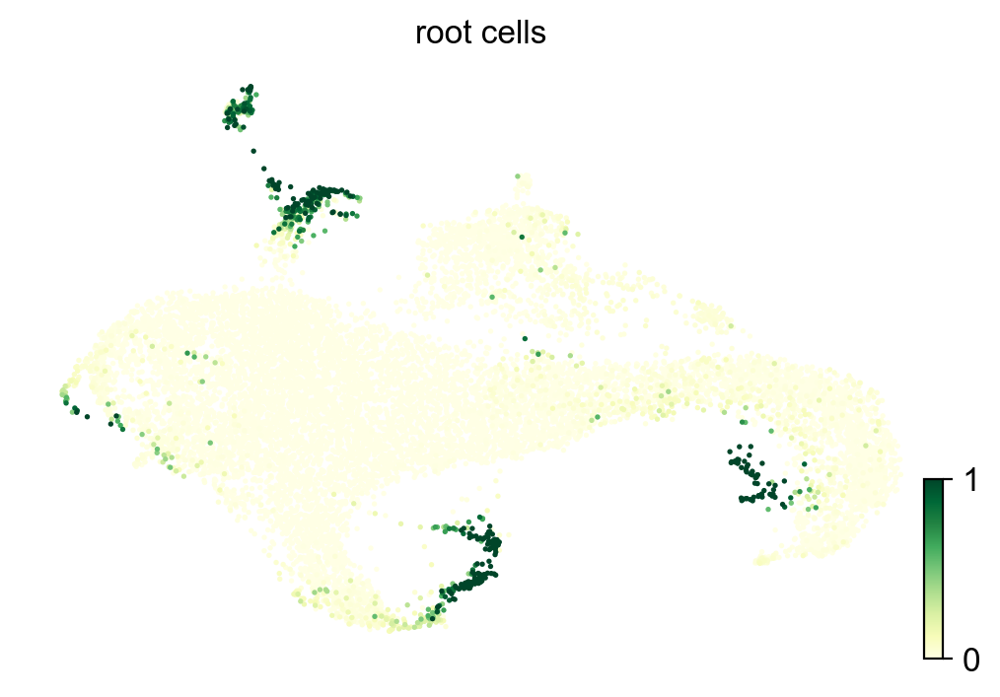

computing terminal states
    identified 1 region of root cells and 1 region of end points 
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_Deprived_P5end_sep.pdf


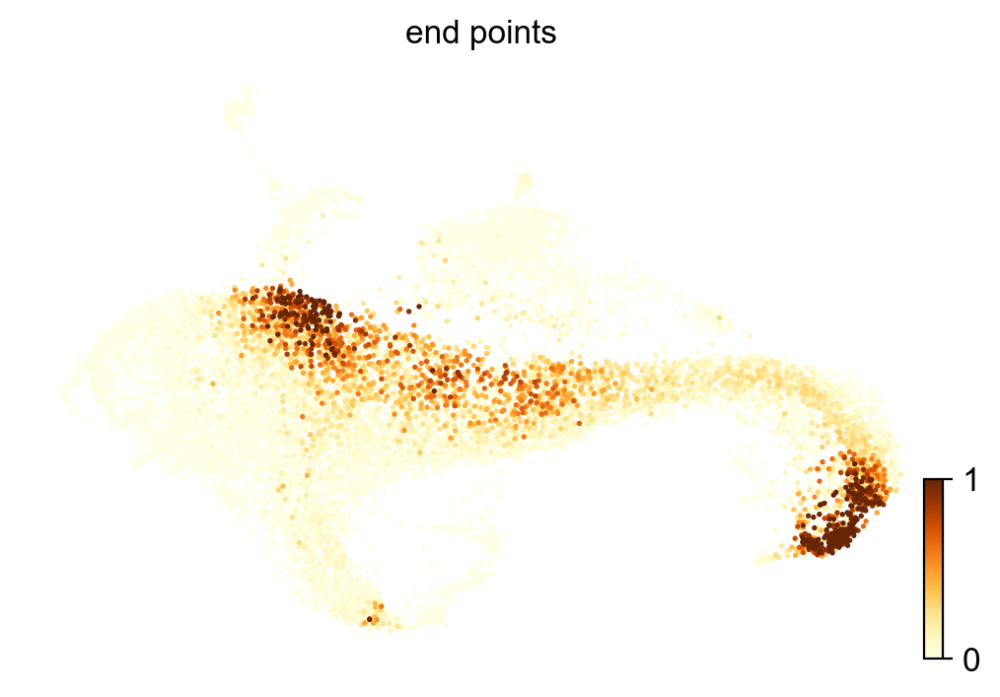

saving figure to file ./figures/scvelo_Deprived_P5root_sep.pdf


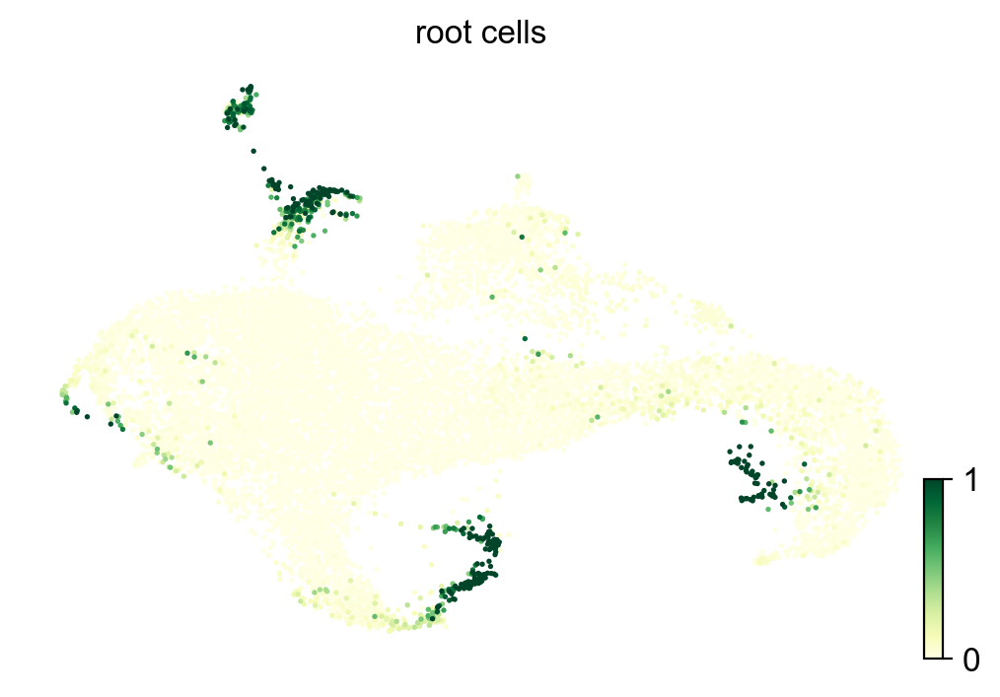

computing terminal states
    identified 1 region of root cells and 1 region of end points 
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_Control_P7end_sep.pdf


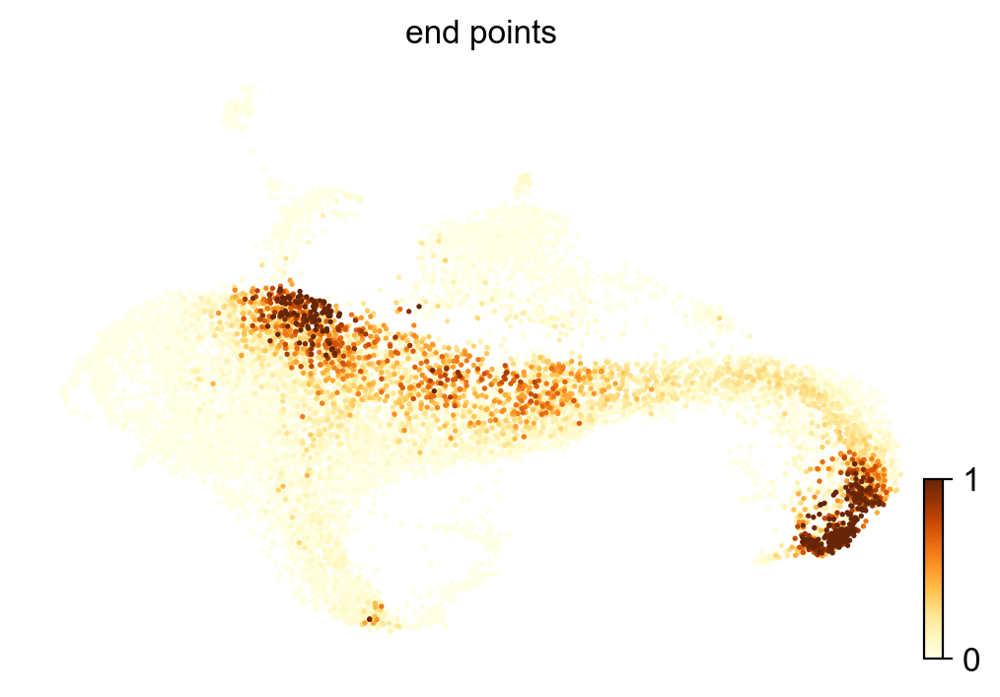

saving figure to file ./figures/scvelo_Control_P7root_sep.pdf


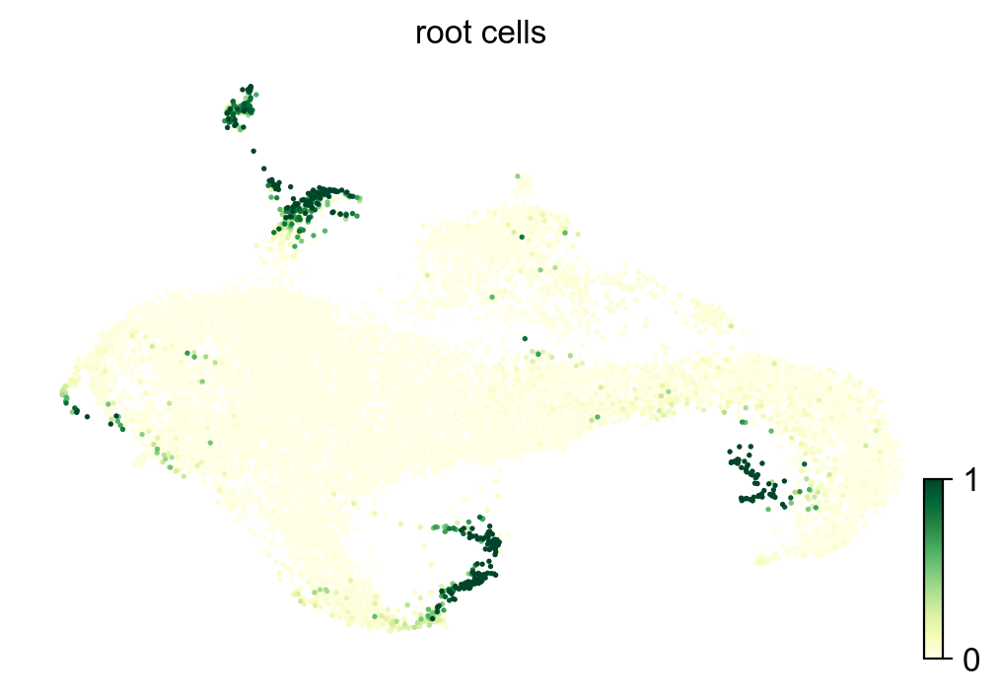

computing terminal states
    identified 1 region of root cells and 1 region of end points 
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_Deprived_P7end_sep.pdf


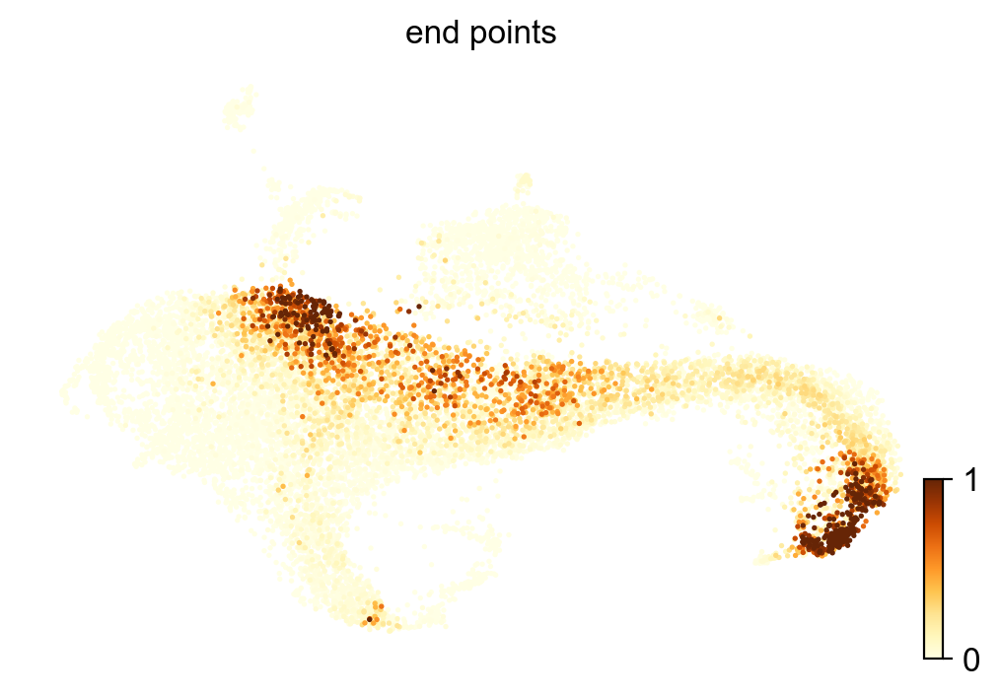

saving figure to file ./figures/scvelo_Deprived_P7root_sep.pdf


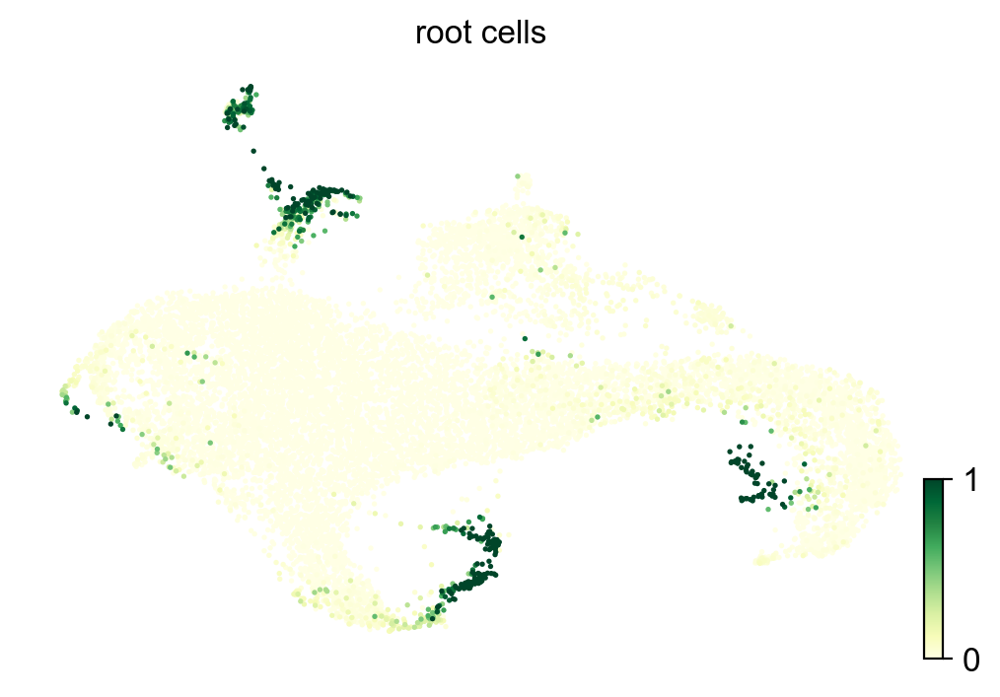

In [63]:
for bdata in l:
    scv.tl.terminal_states(adata)
    scv.pl.scatter(adata, color=['end_points'],save = bdata.obs['sample_description'][1] + 'end_sep',color_map = 'YlOrBr')
    scv.pl.scatter(adata, color=['root_cells'],save = bdata.obs['sample_description'][1] + 'root_sep',color_map = 'YlGn')

In [ ]:
for bdata in l:
    scv.tl.recover_dynamics(bdata, var_names='velocity_genes', n_top_genes=None, max_iter=10, 
                        assignment_mode='projection', t_max=None, fit_time=True, fit_scaling=True, 
                        fit_steady_states=True, fit_connected_states=None, fit_basal_transcription=None, 
                        use_raw=False, load_pars=None, return_model=None, plot_results=False, 
                        steady_state_prior=None, add_key='fit', copy=False)

In [ ]:
for bdata in l:
    r = bdata.obs['root_cells'][bdata.obs['root_cells']==1]
    six = r[bdata.obs['finalclusters'] == '6']
    print(six)

In [ ]:
for bdata in l:
    r = bdata.obs['end_points'][bdata.obs['end_points']==1]
    five = r[bdata.obs['finalclusters'] == '5']
    print(five)

In [ ]:
for bdata in l:
    scv.tl.velocity_pseudotime(bdata, vkey='velocity',root='LD5RC:AAGTTCGCAGTTAGGGx', end = 'LD5RC:CACTAAGCACGAAAGCx',
                              n_dcs=10, use_velocity_graph=True,save_diffmap=None, return_model=None)
    bdata.write(bdata.obs['sample_description'][1]+"separate.h5ad",compression = "gzip")


In [ ]:
for bdata in l:
    scv.pl.scatter(bdata, color='velocity_pseudotime', color_map='gnuplot',save = bdata.obs['sample_description'][1]+"pseudotimeroot6end5")